In [1]:
import numpy as np
import matplotlib.pyplot as plt  
import time as time
from numpy import random
import math
from scipy.special import i0
from scipy.special import i1
from scipy.optimize import root
from scipy.optimize import fsolve
import matplotlib.gridspec as gridspec

In [2]:
#code to get results

def sphere(p,q,dp,dq):
    if q < 0.:
        q = -q
        dq = -dq
        p += np.pi
    if q > np.pi:
        q = 2.*np.pi - q
        dq = -dq
        p += np.pi
    p = np.mod(p,2.*np.pi)
    return p,q,dp,dq

def MultPSphere(p,q,dp,dq):
    for i in range(len(p)):
        if q[i] < 0.:
            q[i] = -q[i]
            dq[i] = -dq[i]
            p[i] += np.pi
        if q[i] > np.pi:
            q[i] = 2.*np.pi - q[i]
            dq[i] = -dq[i]
            p[i] += np.pi
        p = np.mod(p,2.*np.pi)
    return p,q,dp,dq

def zeroToPi(phi):       #Comvert from [-pi,pi) to [0,2pi)
    phi = phi+2.*np.pi
    phi = np.mod(phi,2.*np.pi)
    return phi

def SphereToCart(phi,theta):
    x = np.cos(phi)*np.sin(theta)
    y = np.sin(phi)*np.sin(theta)
    z = np.cos(theta)
    return x,y,z

#These next two functions transform  between cover 1 and cover 2 coordinates 
def Cov1_to_Cov2(phi,theta,phi_dot,theta_dot):    
    cphi = np.cos(phi)
    sphi = np.sin(phi)
    ctheta = np.cos(theta)
    stheta = np.sin(theta)
    x = cphi*stheta
    y = sphi*stheta
    z = ctheta
    xdot = cphi*ctheta*theta_dot - sphi*stheta*phi_dot
    ydot = sphi*ctheta*theta_dot + cphi*stheta*phi_dot
    zdot = -stheta*theta_dot
    psi = np.arctan2(z,y)
    chi = np.arccos(x)
    psi_dot = (y*zdot - z*ydot)/(z**2 + y**2)
    chi_dot = -xdot/(np.sin(chi))
    return psi,chi,psi_dot,chi_dot

def Cov2_to_Cov1(psi,chi,psi_dot,chi_dot):
    cpsi = np.cos(psi)
    spsi = np.sin(psi)
    cchi = np.cos(chi)
    schi = np.sin(chi)
    y = cpsi*schi
    z = spsi*schi
    x = cchi
    ydot = cpsi*cchi*chi_dot-spsi*schi*psi_dot
    zdot = spsi*cchi*chi_dot+cpsi*schi*psi_dot
    xdot = -schi*chi_dot
    phi = np.arctan2(y,x)
    theta = np.arccos(z)
    phi_dot = (x*ydot - y*xdot)/(y**2 + x**2)
    theta_dot = -zdot/np.sin(theta)
    return phi,theta,phi_dot,theta_dot

def TwoToOne_x(psi,chi):
    cpsi = np.cos(psi)
    spsi = np.sin(psi)
    cchi = np.cos(chi)
    schi = np.sin(chi)
    y = cpsi*schi
    z = spsi*schi
    x = cchi
    phi = np.arctan2(y,x)
    theta = np.arccos(z)
    return phi,theta

def OneToTwo_x(phi,theta):    
    cphi = np.cos(phi)
    sphi = np.sin(phi)
    ctheta = np.cos(theta)
    stheta = np.sin(theta)
    x = cphi*stheta
    y = sphi*stheta
    z = ctheta
    psi = np.arctan2(z,y)
    chi = np.arccos(x)
    return psi,chi

def TwoToOne_u(psi,chi,psi_dot,chi_dot):
    cpsi = np.cos(psi)
    spsi = np.sin(psi)
    cchi = np.cos(chi)
    schi = np.sin(chi)
    y = cpsi*schi
    z = spsi*schi
    x = cchi
    ydot = cpsi*cchi*chi_dot-spsi*schi*psi_dot
    zdot = spsi*cchi*chi_dot+cpsi*schi*psi_dot
    xdot = -schi*chi_dot
    theta = np.arccos(z)
    phi_dot = (x*ydot - y*xdot)/(y**2 + x**2)
    theta_dot = -zdot/np.sin(theta)
    return phi_dot,theta_dot

def OneToTwo_u(phi,theta,phi_dot,theta_dot):
    cphi = np.cos(phi)
    sphi = np.sin(phi)
    ctheta = np.cos(theta)
    stheta = np.sin(theta)
    x = cphi*stheta
    y = sphi*stheta
    z = ctheta
    xdot = cphi*ctheta*theta_dot - sphi*stheta*phi_dot
    ydot = sphi*ctheta*theta_dot + cphi*stheta*phi_dot
    zdot = -stheta*theta_dot
    chi = np.arccos(x)
    psi_dot = (y*zdot - z*ydot)/(z**2 + y**2)
    chi_dot = -xdot/(np.sin(chi))
    return psi_dot,chi_dot

#Sums in interaction terms 
def d2p_Sum(p,q,N):                               #The sum in the interation for phi double dot
    phi_i = np.outer(p,np.ones(N))             
    phi_j = np.outer(np.ones(N),p) 
    arg = phi_i - phi_j                                                           #The ijth entry of this matrx is phi_i minus phi_j 
    sin_arg = np.sin(arg)                                                         #The ijth entry of this matrx is sin(phi_i - phi_j)
    sin_vec = -1.*np.matmul(sin_arg,np.sin(q))                                    #Produces a vector where the nth entry of the vector is -1*\sum_{i=1}^{N}sin(theta_i)sin(phi_n-phi_i)
    return sin_vec

def d2q_Sum(p,q,N):                              #The sum in the interation for theta double dot
    phi_i = np.outer(p,np.ones(N))             
    phi_j = np.outer(np.ones(N),p) 
    arg = phi_i - phi_j 
    cos_arg = np.cos(arg)                      #The ijth entry of this matrx is cos(phi_i - phi_j)
    sin_q = np.sin(q)
    cos_q = np.cos(q)
    sc_q = np.outer(sin_q,cos_q)                         #The ijth entry of this matrix is sin(theta_i)cos(theta_j)
    one_mat = np.full((N,N),1.)                          #N by N matrix with 1 for all entries
    Sum_mat = np.matmul(cos_arg,sc_q)-np.matmul(sc_q,one_mat) #The ijth entry of this matrix is \sum_{k=1}^{N}cos(phi_i-phi_k)sin(theta_k)cos(theta_j)-sin(theta_i)cos(theta_k)
    Sum_vec = np.diagonal(Sum_mat) #The nth entry of this vector is \sum_{k=1}^{N}cos(phi_n-phi_k)sin(theta_k)cos(theta_n)-sin(theta_n)cos(theta_k)
    return Sum_vec


#kick function with interaction 
def kick(h,p,q,dp,dq,d2pSum,d2qSum,scnd_ord,alpha):
    if alpha == 0:
        if scnd_ord == True:    
            d2phi_a = -2.*h*dp*dq/np.tan(q)
            d2phi_b = h**2*(2.*dp*dq**2/np.tan(q)**2 - dp**3*np.cos(q)**2)
            d2theta_a = (h/2.)*np.sin(2*q)*dp**2
            d2theta_b = -2*h**2*dp*dq**2*np.cos(q)**2
            return dp + d2phi_a + d2phi_b, dq + d2theta_a + d2theta_b
        else: 
            d2phi_a = -2.*h*dp*dq/np.tan(q)
            d2theta_a = (h/2.)*np.sin(2*q)*dp**2
            return dp + d2phi_a, dq + d2theta_a
    else: 
        if scnd_ord == True:    
            d2phi_a = -2.*h*dp*dq/np.tan(q)
            d2phi_b = h**2*(2.*dp*dq**2/np.tan(q)**2 - dp**3*np.cos(q)**2)
            d2theta_a = (h/2.)*np.sin(2*q)*dp**2
            d2theta_b = -2*h**2*dp*dq**2*np.cos(q)**2
            return dp + d2phi_a + d2phi_b, dq + d2theta_a + d2theta_b
        else: 
            d2phi_a = h*(alpha*(d2pSum/np.sin(q))-(2.*dp*dq/np.tan(q)))
            d2theta_a = h*(alpha*d2qSum + (1/2.)*np.sin(2*q)*dp**2)
            return dp + d2phi_a, dq + d2theta_a
        
def drift(h,p,q,dp,dq):
    p += h*dp
    q += h*dq
    return p, q
    

def RotM(I): #Rotation matrix for rotating a vector from the equatorial great circle to the great circle inclined from the x-y plane at an angle I 
    cI = np.cos(I)
    sI = np.sin(I)
    R = np.array([[1,0,0],
                [0,cI,-sI],
                [0,sI,cI]])
    return R

def GcRot(Inc,phi,theta,dphi,dtheta):       #Returns coordinates for rotated GC inclined at angle = Inc 
    cphi = np.cos(phi)
    sphi = np.sin(phi)
    ctheta = np.cos(theta)
    stheta = np.sin(theta)
    x = cphi*stheta              #Cartesian coordinates of points on equator
    y = sphi*stheta
    z = ctheta
    Cart = np.zeros((3,len(phi)))     #Place to store cartesian coordinates on equator
    CartR = np.zeros((3,len(phi)))    #Place to store rotated cartesian coordinates 
    Cart[0],Cart[1],Cart[2] = x,y,z #ith column of Cart is now the ith vector on the equator
    for i in range(len(phi)):
        CartR[:,i] = np.matmul(RotM(Inc),Cart[:,i]) #ith column of CartR is now the ith rotated vector 
    phi_r = np.arctan2(CartR[1],CartR[0]) #phi of points on inclined GC
    theta_r = np.arccos(CartR[2])          #theta of points on inclined GC
    cphi_r = np.cos(phi_r)
    sphi_r = np.sin(phi_r)
    ctheta_r = np.cos(theta_r)
    stheta_r = np.sin(theta_r)
    dphi_r = ((cphi_r/cphi)**2)*((np.cos(Inc)-np.sin(Inc)*sphi*(ctheta/stheta))*dphi + (np.sin(Inc)*cphi/stheta**2)*dtheta)     #dphi of points on inclined GC
    dtheta_r = (-1/stheta_r)*(dphi*np.sin(Inc)*cphi*stheta+(np.sin(Inc)*sphi*ctheta-stheta*np.cos(Inc))*dtheta) #dtheta of points on inclined GC
    phi_r,theta_r,dphi_r,dtheta_r = MultPSphere(phi_r,theta_r,dphi_r,dtheta_r)
    return phi_r,theta_r,dphi_r,dtheta_r

def dOmega(omega,phi,theta,dphi,dtheta): #Derivative of Omega
    dOm = (np.sin(phi)*np.sin(theta)*dphi-np.cos(phi)*np.cos(theta)*dtheta)/np.sin(omega)
    return dOm

def Omega(phi,theta): #Get angle between x hat and vector on great circle with coordinates phi,theta
    Omega = np.ones(len(phi))
    st = np.sin(theta)
    cp = np.cos(phi)
    for i in range(len(phi)):
        if phi[i]<np.pi:
            Omega[i] = np.arccos(cp[i]*st[i])
        else:
            Omega[i] = 2.*np.pi-np.arccos(cp[i]*st[i])
    return Omega

def K_tot(p,q,dp,dq,M):            #total kinetic energy at a given point in phase space
    NumPart = len(p)
    dp_sq = dp*np.sin(q)
    dpsq_dot = np.dot(dp_sq,dp_sq)
    dq_dot = np.dot(dq,dq)
    K = (M/NumPart)*(dpsq_dot + dq_dot)/2
    return K

def S_ij(p,q):     #N by N matrix (N is number of particles) where ijth entry is cos(theta_i)cos(theta_j)+sin(theta_i)sin(theta_j)cos(phi_i-phi_j) for i not equal to j and 0 for diagonal entries 
    NumPart = len(p)
    phi_i = np.outer(p,np.ones(NumPart))             
    phi_j = np.outer(np.ones(NumPart),p)
    arg = phi_i - phi_j 
    cos_arg = np.cos(arg) 
    sq = np.sin(q)
    cq = np.cos(q)
    sq_ij = np.outer(sq,sq)     #N by N matrix where ijth entry is sin(theta_i)sin(theta_j)
    sqCarg_ij = sq_ij*cos_arg   #N by N matrix where ijth entry is sin(theta_i)sin(theta_j)cos(phi_i-phi_j)
    cq_ij = np.outer(cq,cq)     #N by N matrix where ijth entry is cos(theta_i)cos(theta_j)
    S_ij = cq_ij + sqCarg_ij 
    return S_ij

def U_tot(p,q,alpha,M):                      #returns total potential energy
    NumPart = len(p)
    S_i = np.matmul(S_ij(p,q),np.ones(NumPart))  #ith row is sum over j of S_ij matrix
    U = ((M*alpha)/(2*(NumPart**2)))*(NumPart-np.dot(S_i,np.ones(NumPart)))         #Total potential energy
    return U

def aveLength(p,q):       #average arc length between all particles on sphere
    arclengths = np.arccos(S_ij(p,q))
    mean = np.mean(arclengths)
    return mean 

def TwoD_CM(phiVals,thetaVals):    #Get spherical coordinates of center of mass for 2D-HMF
    cp,sp,ct,st = np.cos(phiVals),np.sin(phiVals),np.cos(thetaVals),np.sin(thetaVals)
    xVals,yVals,zVals = cp*st,sp*st,ct
    xCM,yCM,zCM = np.mean(xVals),np.mean(yVals),np.mean(zVals)
    phiCM,thetaCM = np.arctan2(yCM,xCM),np.arccos(zCM)
    phiCM = zeroToPi(phiCM) #Get it in [0,2pi)
    return phiCM,thetaCM

def Rot2D_CM(phiCM,thetaCM,phiVals,thetaVals,N):                                   #Rotate points so that CM is located at north pole (0,0,1)
    cp,sp,ct,st = np.cos(phiVals),np.sin(phiVals),np.cos(thetaVals),np.sin(thetaVals)
    xVals,yVals,zVals = cp*st,sp*st,ct
    cpCM,spCM,ctCM,stCM = np.cos(phiCM),np.sin(phiCM),np.cos(thetaCM),np.sin(thetaCM)
    Cart = np.zeros((3,N))     #Place to store cartesian coordinates before rotation
    CartR = np.zeros((3,N))    #Place to store rotated cartesian coordinates 
    Cart[0],Cart[1],Cart[2] = xVals,yVals,zVals
    Rz = np.array([[cpCM,spCM,0],[-spCM,cpCM,0],[0,0,1]])      #matrix to rotate about z-axis by -phiCM
    Ry = np.array([[ctCM,0,-stCM],[0,1,0],[stCM,0,ctCM]])      #matrix to rotate about z-axis by -thetaCM
    R = np.matmul(Rz,Ry)     #product of above rotation matrices
    for i in range(N):
        CartR[:,i] = np.matmul(R,Cart[:,i])
    phi_r = np.arctan2(CartR[1],CartR[0]) #phi of rotated points    
    theta_r = np.arccos(CartR[2])          #theta of rotated points 
    phi_r = zeroToPi(phi_r)
    return phi_r,theta_r
    

In [3]:
#Functions for 1D-HMF
def OneDHam(p,dp,N,alpha,M):                #Computes 1D hamiltonian 
    pi = np.outer(p,np.ones(N))
    pj = np.outer(np.ones(N),p)
    arg = pi - pj
    cos_arg = np.cos(arg)
    U = -(alpha*(M/N)**2)*(np.sum(cos_arg)-N)/2     #Total potential energy
    K = (M*np.dot(dp,dp))/(2*N)           #Total kinetic energy
    H = K+U 
    return H

def derivs(y,N,alpha):
    dy = np.zeros_like(y)
    dy[0,:] = y[1,:]           #dtheta
    xi = np.outer(y[0,:],np.ones(N))
    xj = np.outer(np.ones(N),y[0,:])
    arg = xi - xj               
    dy[1,:] = -((alpha*M**2)/N)*np.matmul(np.sin(arg),np.ones(N)) #d^2theta
    return dy

def OneD_Integrate(N,Nt,h,p0,dp0,alpha,M):
    yVals = np.zeros((Nt,2,N))       #To store phase space coordinates for all times
    y = np.zeros((2,N))
    y[0,:] = p0
    y[1,:] = dp0
    yVals[0,:] = y
    time = np.zeros(Nt)
    
    for j in range(Nt-1):
        k1 = h*derivs(y,N,alpha)
        ytmp = y + k1/2.
        k2 = h*derivs(ytmp,N,alpha)
        y = y + k2
        y[0,:] = np.mod(y[0,:],2.*np.pi)
        yVals[j+1,:] = y 
        time[j+1] = time[j]+h
    return yVals[:,0,:],yVals[:,1,:]

def OneD_B(alpha,M,N,p):                #Magnetization. It does not give correct values compared to integral
    e = alpha*M/N  
    cp = np.cos(p)
    B = -e*np.dot(np.ones(N),np.cos(p))
    return B 

#problem with magnetization function is that it doesn't given same values as that of Chauvinis paper

def OneD_CM(theta):    #Get theta polar coordinate of center of mass for 1D-HMF
    x = np.cos(theta)
    y = np.sin(theta)
    xmean = np.mean(x)
    ymean = np.mean(y)
    theta_CM = np.arctan2(ymean,xmean)
    theta_CM = np.mod(theta_CM,2.*np.pi)
    return theta_CM

def Rotate_1D(thetaVals,RotAngle,N): #Rotate coordinate system for 1D-HMF by angle RotAngle. Note that theta dot is invariant under rotation here
    cA = np.cos(RotAngle)
    sA = np.sin(RotAngle)
    R = np.array([[cA,-sA],[sA,cA]])
    x = np.cos(thetaVals)
    y = np.sin(thetaVals)
    Cart = np.zeros((2,N))
    Cart[0],Cart[1] = x,y
    CartR = np.zeros((2,N))
    for i in range(N):
        CartR[:,i] = np.matmul(R,Cart[:,i]) #ith column of CartR is now the ith rotated vector in cartesian coordinates
    theta_rot = np.arctan2(CartR[1],CartR[0])
    return theta_rot 

In [4]:
def TCrit1D(alpha,M,N):       #1D-HMF critical temp
    return alpha*(M**2)/(2*N)

def EqFunc(x,T,alpha,M,N):      #Function whos roots determine B given T 
    return (x*T/TCrit(alpha,M,N))-(2*i1(x)/i0(x))

def Temp1D(dtheta,M,N):
    vsq = dtheta**2
    T = np.mean(vsq)*M/N  #T = <dtheta**2>*m
    return T 

def GetB(rootGuess,T,alpha,M,N):
    roots = fsolve(func = EqFunc,x0=rootGuess,args=(T,alpha,M,N))
    CloseEnough = np.isclose(EqFunc(roots,T,alpha,M,N), np.zeros(len(roots)),rtol=1e-5, atol=1e-6) 
    roots = roots[CloseEnough]     #Get only roots that are close enough
    BVals = roots*T               #Compute B values
    return BVals
    
def Rho(theta,alpha,M,T,B,N):       #Spatial density for 1D-HMF
    x = (M*B/N*T)
    r0 = M/(2.*np.pi*i0(x))
    Rho = r0*np.exp(-x*np.cos(theta))
    return Rho

In [5]:
scnd_ord = False
thresh = np.sin(np.pi/4)

def integration(N,Nt,h,alpha,M,phi_0,theta_0,dphi_0,dtheta_0): 
    xVals_1 = np.ones((Nt,2,N))                         #An array to store position values at full steps in first cover. The ith array will have values of phi and theta at the time t = i*dt
    uHalfVals_1 = np.ones((Nt,2,N))                     #An array to store velocity values at midpoint steps in first cover. The ith array will have values of dot(phi) and dot(theta) at the time t = i*dt+dt/2
    uVals_1 = np.ones((Nt,2,N))
    xVals_2 = np.ones((Nt,2,N))                         #for storing velocity values at full steps in first cover. The ith array will have values of phi_dot and theta_dot at the time t = i*dt    xVals_2 = np.ones((Nt,2,N))                         #An array to store position values at full steps in second cover. The ith array will have values of phi and theta at the time t = i*dt
    uHalfVals_2 = np.ones((Nt,2,N))                     #An array to store velocity values at midpoint steps in second cover. The ith array will have values of dot(phi) and dot(theta) at the time t = i*dt+dt/2
    uVals_2 = np.ones((Nt,2,N))                         #for storing velocity values at full steps in second cover. The ith array will have values of psi_dot and chi_dot at the time t = i*dt
    H = np.ones(Nt)
    K = np.ones(Nt)
    U = np.ones(Nt)
    time = np.zeros(Nt)
    
    xVals_1[0,0,:],xVals_1[0,1,:] = phi_0,theta_0                #phi and theta at t = 0
    uVals_1[0,0,:],uVals_1[0,1,:] = dphi_0,dtheta_0              #Their derivatives at t = 0
    
    alpha = alpha*M/N
    K[0],U[0] = K_tot(phi_0,theta_0,dphi_0,dtheta_0,M), U_tot(phi_0,theta_0,alpha,M)
    
    #Get cover 2 coordinates at t = 0 
    xVals_2[0,0,:],xVals_2[0,1,:],uVals_2[0,0,:],uVals_2[0,1,:] = Cov1_to_Cov2(xVals_1[0,0,:],xVals_1[0,1,:],uVals_1[0,0,:],uVals_1[0,1,:])
    #Get interaction sums at time zero
    phi_SumVec_0,theta_SumVec_0,psi_SumVec_0,chi_SumVec_0 = d2p_Sum(phi_0,theta_0,N),d2q_Sum(phi_0,theta_0,N),d2p_Sum(xVals_2[0,0,:],xVals_2[0,1,:],N),d2q_Sum(xVals_2[0,0,:],xVals_2[0,1,:],N)  
    #Compute velocities at t = h/2 
    uHalfVals_1[0,0,:],uHalfVals_1[0,1,:] = kick(h/2,xVals_1[0,0,:],xVals_1[0,1,:],uVals_1[0,0,:],uVals_1[0,1,:],phi_SumVec_0,theta_SumVec_0,scnd_ord,alpha)
    uHalfVals_2[0,0,:],uHalfVals_2[0,1,:] = kick(h/2,xVals_2[0,0,:],xVals_2[0,1,:],uVals_2[0,0,:],uVals_2[0,1,:],psi_SumVec_0,chi_SumVec_0,scnd_ord,alpha)

    for t in range(Nt-1):
        phi,theta,dphi_h,dtheta_h,dphi,dtheta = xVals_1[t,0,:],xVals_1[t,1,:],uHalfVals_1[t,0,:],uHalfVals_1[t,1,:],uVals_1[t,0,:],uVals_1[t,1,:]     #Store cover 1 coordinates at initial time step and velocities at half step ahead
        psi,chi,dpsi_h,dchi_h,dpsi,dchi = xVals_2[t,0,:],xVals_2[t,1,:],uHalfVals_2[t,0,:],uHalfVals_2[t,1,:],uVals_2[t,0,:],uVals_2[t,1,:]           #Store cover 2 coordinates at initial time step and velocities at half step ahead
        phi_SumVec,theta_SumVec,psi_SumVec,chi_SumVec = d2p_Sum(phi,theta,N),d2q_Sum(phi,theta,N),d2p_Sum(psi,chi,N),d2q_Sum(psi,chi,N)     #Vectors containing the interaction term sums for all N particles at initial time step
        phi_temp,theta_temp,psi_temp,chi_temp = np.zeros(N),np.ones(N),np.zeros(N),np.ones(N) #Arrays to store computed position coordinates at h(t+1) that have not been corrected
        for n in range(N):  #Get all N particles' non-corrected position coordinates at h(t+1) to be able to compute interaction terms at h(t+1)
            if np.sin(theta[n])<thresh:
                psi_temp[n],chi_temp[n] = drift(h,psi[n],chi[n],dpsi_h[n],dchi_h[n]) #psi,chi at h(t+1)
                phi_temp[n],theta_temp[n] = TwoToOne_x(psi_temp[n],chi_temp[n])      #phi,theta at h(t+1)
            else:
                phi_temp[n],theta_temp[n] = drift(h,phi[n],theta[n],dphi_h[n],dtheta_h[n]) #phi,theta at h(t+1)
                psi_temp[n],chi_temp[n] = OneToTwo_x(phi_temp[n],theta_temp[n])          #psi,chi at h(t+1)
        phi_SumVec_f,theta_SumVec_f,psi_SumVec_f,chi_SumVec_f = d2p_Sum(phi_temp,theta_temp,N),d2q_Sum(phi_temp,theta_temp,N),d2p_Sum(psi_temp,chi_temp,N),d2q_Sum(psi_temp,chi_temp,N)     #Vectors containing the interaction term sums for all N particles at final time step   
        for n in range(N):
            if np.sin(theta_temp[n])<thresh:
                dpsi_f,dchi_f = kick(h/2,psi_temp[n],chi_temp[n],dpsi_h[n],dchi_h[n],psi_SumVec_f[n],chi_SumVec_f[n],scnd_ord,alpha)   #Get psi,chi derivatives at h(t+1) 
                dphi_f,dtheta_f = TwoToOne_u(psi_temp[n],chi_temp[n],dpsi_f,dchi_f)                                              #Convert Cover2 derivatives at time h(t+1) to cover1 derivatives
                phi_f,theta_f,dphi_f,dtheta_f = sphere(phi_temp[n],theta_temp[n],dphi_f,dtheta_f) 
                psi_f,chi_f,dpsi_f,dchi_f = sphere(psi_temp[n],chi_temp[n],dpsi_f,dchi_f)
                xVals_1[t+1,0,n],xVals_1[t+1,1,n],uVals_1[t+1,0,n],uVals_1[t+1,1,n] = phi_f,theta_f,dphi_f,dtheta_f  #Store cover 1 coordinates at h(t+1)
                xVals_2[t+1,0,n],xVals_2[t+1,1,n],uVals_2[t+1,0,n],uVals_2[t+1,1,n] = psi_f,chi_f,dpsi_f,dchi_f  #Store cover 2 coordinates at h(t+1)
            else:
                dphi_f,dtheta_f = kick(h/2,phi_temp[n],theta_temp[n],dphi_h[n],dtheta_h[n],phi_SumVec_f[n],theta_SumVec_f[n],scnd_ord,alpha)   #Get phi,theta derivatives at h(t+1) 
                dpsi_f,dchi_f = OneToTwo_u(phi_temp[n],theta_temp[n],dphi_f,dtheta_f)   #Get psi,chi derivatives at h(t+1) 
                phi_f,theta_f,dphi_f,dtheta_f = sphere(phi_temp[n],theta_temp[n],dphi_f,dtheta_f)                                        #Correct coordinates
                psi_f,chi_f,dpsi_f,dchi_f = sphere(psi_temp[n],chi_temp[n],dpsi_f,dchi_f)
                xVals_1[t+1,0,n],xVals_1[t+1,1,n],uVals_1[t+1,0,n],uVals_1[t+1,1,n] = phi_f,theta_f,dphi_f,dtheta_f  #Store cover 1 coordinates at h(t+1)
                xVals_2[t+1,0,n],xVals_2[t+1,1,n],uVals_2[t+1,0,n],uVals_2[t+1,1,n] = psi_f,chi_f,dpsi_f,dchi_f  #Store cover 2 coordinates at h(t+1)
        if t < Nt-2:
            uHalfVals_2[t+1,0,:],uHalfVals_2[t+1,1,:] = kick(h/2,xVals_2[t+1,0,:],xVals_2[t+1,1,:],uVals_2[t+1,0,:],uVals_2[t+1,1,:],psi_SumVec_f,chi_SumVec_f,scnd_ord,alpha)   #Get psi,chi derivatives at time h(t+1)+h/2
            uHalfVals_1[t+1,0,:],uHalfVals_1[t+1,1,:] = kick(h/2,xVals_1[t+1,0,:],xVals_1[t+1,1,:],uVals_1[t+1,0,:],uVals_1[t+1,1,:],phi_SumVec_f,theta_SumVec_f,scnd_ord,alpha)   #Get phi,theta derivatives at time h(t+1)+h/2 
        K[t+1],U[t+1] = K_tot(xVals_1[t+1,0,:],xVals_1[t+1,1,:],uVals_1[t+1,0,:],uVals_1[t+1,1,:],M), U_tot(xVals_1[t+1,0,:],xVals_1[t+1,1,:],alpha,M)
        time[t+1] = time[t] + h
    
    return xVals_1[:,0,:],xVals_1[:,1,:],uVals_1[:,0,:],uVals_1[:,1,:],K,U,time

In [6]:
def TwoD_UniformPos_GaussVel(N,scaleTc,alpha,M):
    T_c = M*alpha/2        #alpha = k/2pi , so critical temperature is kM/4pi = M*alpha/2
    phi_0,theta_0 = np.random.uniform(0,2.*np.pi,N),np.random.uniform(0,np.pi,N) #Uniformly distrubted positions 
    v_phi0,dtheta_0 = random.normal(loc=0,scale=np.sqrt(scaleTc*T_c/2),size = N),random.normal(loc=0,scale=np.sqrt(scaleTc*T_c/2),size = N) #Make std = sqrt(T/2) so that v_{rms}^2 = T
    dphi_0 = v_phi0/np.sin(theta_0)
    return phi_0,theta_0,dphi_0,dtheta_0 

def OneD_UniformPos_GaussVel(N,scaleTc,alpha,M):
    T_c = M*alpha/2        #alpha = k/2pi , so critical temperature is kM/4pi = M*alpha/2
    phi_0= np.random.uniform(0,2.*np.pi,N)  #Uniformly distrubted positions 
    dphi_0 = random.normal(loc=0,scale=np.sqrt(scaleTc*T_c),size = N)  #This makes v_{rms}^2 = T
    return phi_0,dphi_0 

In [7]:
phiVals = np.genfromtxt("PhiVals_N=5000_T=0.csv",delimiter=',')
thetaVals = np.genfromtxt("ThetaVals_N=5000_T=0.csv",delimiter=',')
dphiVals = np.genfromtxt("dPhiVals_N=5000_T=0.csv",delimiter=',')
dthetaVals = np.genfromtxt("dThetaVals_N=5000_T=0.csv",delimiter=',')
KVals = np.genfromtxt("KVals_N=5000_T=0.csv",delimiter=',')
UVals = np.genfromtxt("UVals_N=5000_T=0.csv",delimiter=',')

In [8]:
timeVals= np.genfromtxt("timeVals_N=5000_T=0.csv",delimiter=',')

In [9]:
phiSint = phiVals*np.sin(thetaVals) #phi*sin(theta)
dphiSint = dphiVals*np.sin(thetaVals) #phi*sin(theta)
cosTheta = np.cos(thetaVals) #cos(theta)

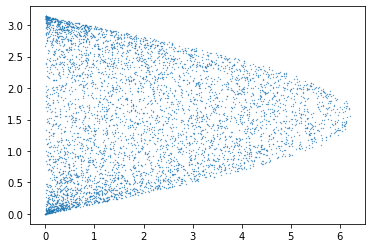

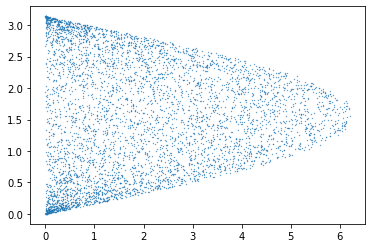

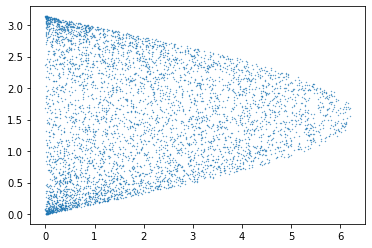

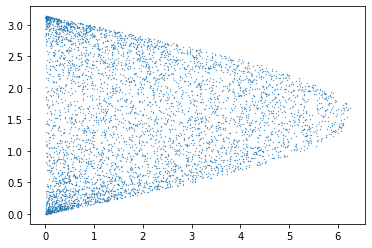

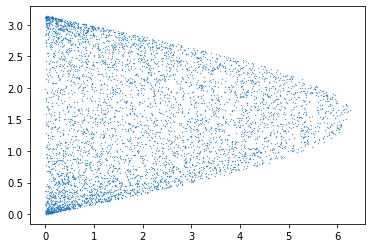

...

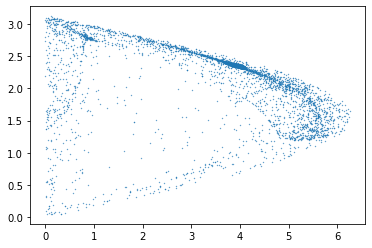

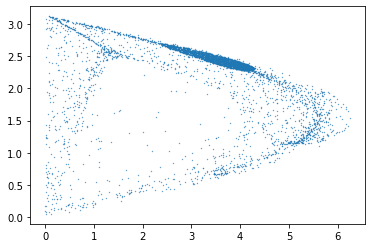

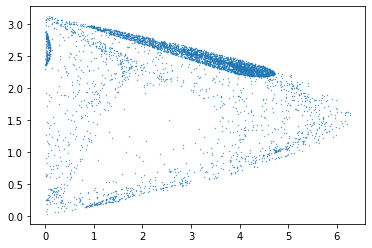

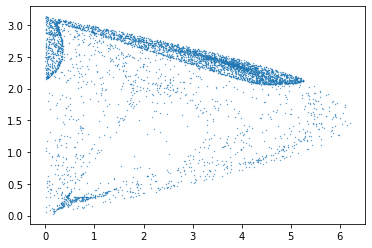

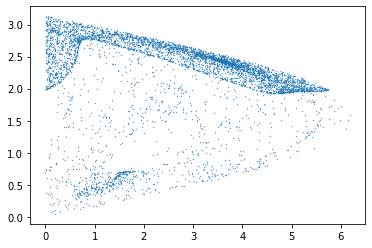

In [10]:
#phi*sin(theta) vs theta
for i in range(40):
    plt.scatter(phiSint[int(i*100),:],thetaVals[int(i*100),:],s=0.1)
    plt.show()

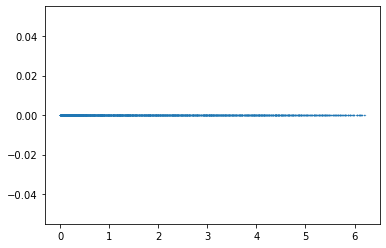

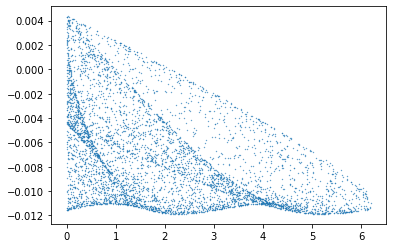

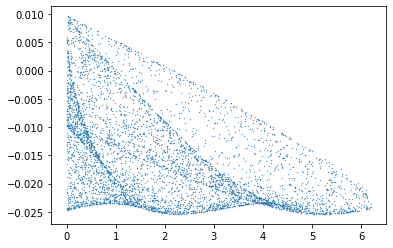

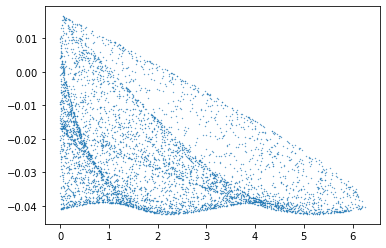

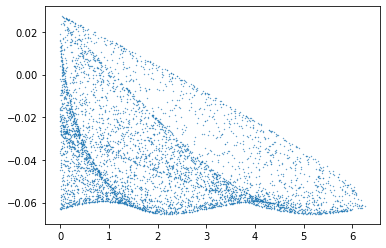

...

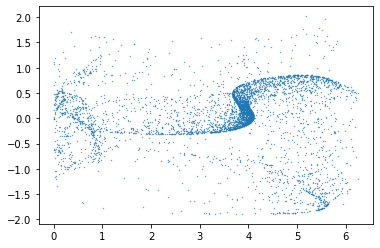

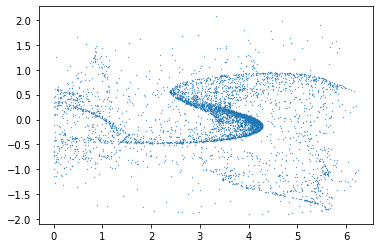

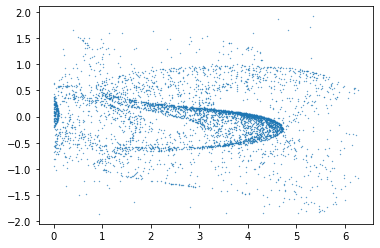

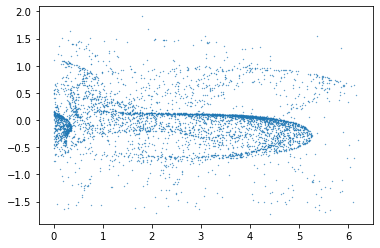

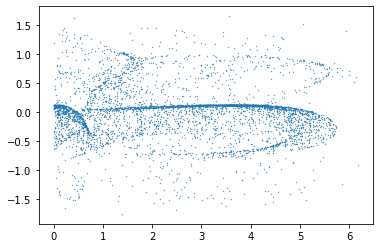

In [11]:
#phi*sin(theta) vs dtheta
for i in range(40):
    plt.scatter(phiSint[int(i*100),:],dthetaVals[int(i*100),:],s=0.1)
    plt.show()

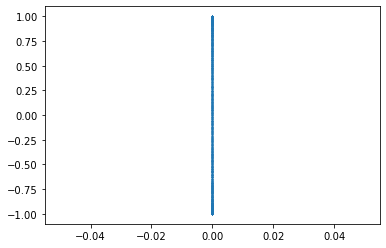

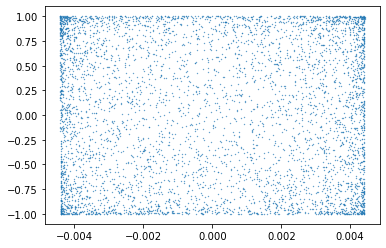

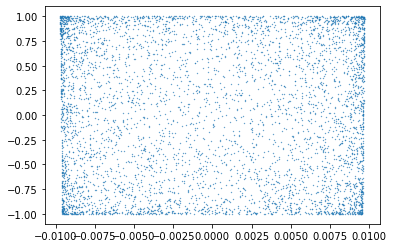

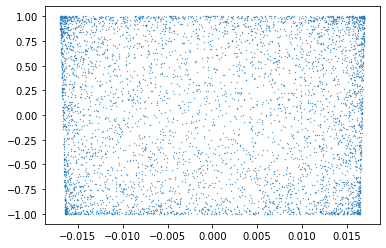

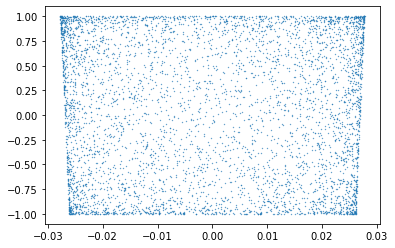

...

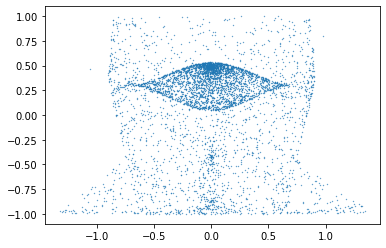

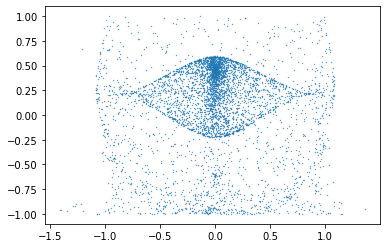

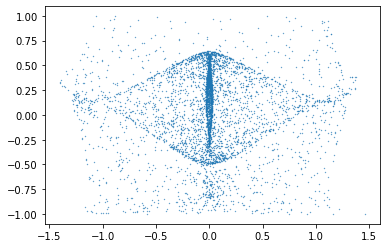

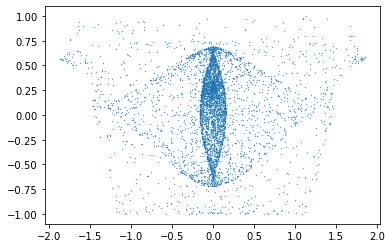

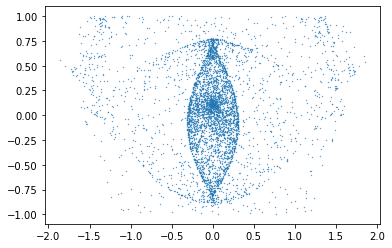

In [ ]:
#dphi*sin(theta) vs cos(theta)
for i in range(40):
    plt.scatter(dphiSint[int(i*100),:],cosTheta[int(i*100),:],s=0.1)
    plt.show()

In [ ]:
#dphi*sin(theta) vs theta
for i in range(40):
    plt.scatter(dphiSint[int(i*100),:],thetaVals[int(i*100),:],s=0.1)
    plt.show()

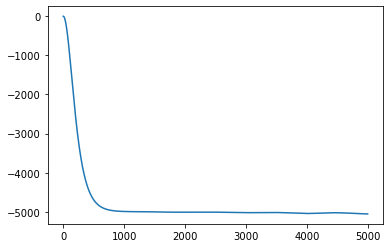

In [55]:
plt.plot(KVals/UVals)

Text(0, 0.5, 'Kinetic energy')

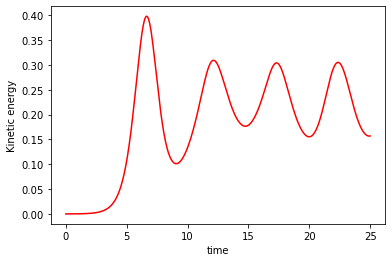

In [66]:
plt.plot(timeVals,KVals,c="r")
plt.xlabel("time")
plt.ylabel("Kinetic energy")

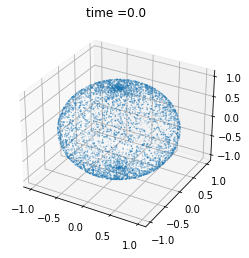

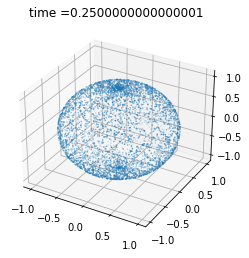

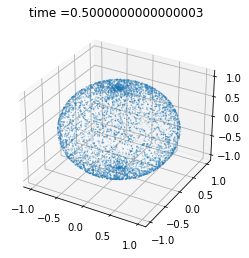

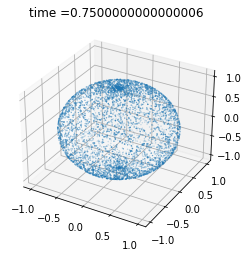

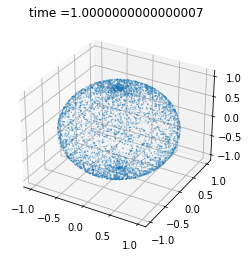

...

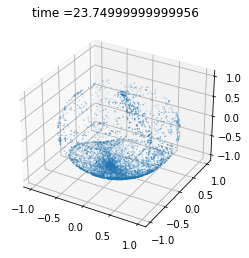

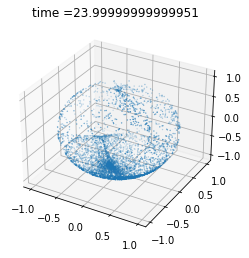

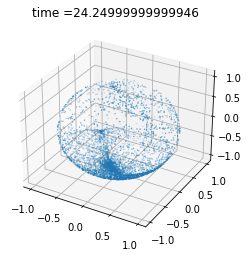

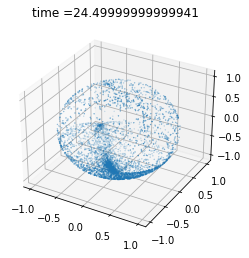

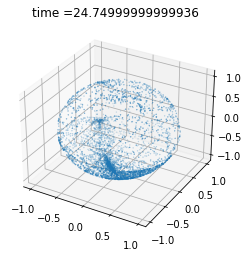

In [74]:
x,y,z = SphereToCart(phiVals,thetaVals)
for i in range(100):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(x[int(i*50)], y[int(i*50)], z[int(i*50)], s=0.1)
    plt.title("time ="+str(timeVals[int(i*50)]))
    plt.show()

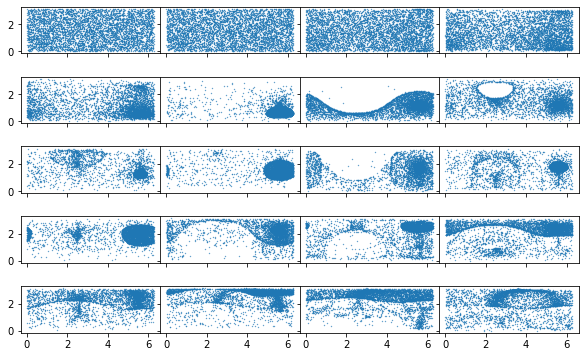

In [140]:
#5000/8 = 625
#More plots
numPlots = 20
numRows,numCols = 5,4
fig = plt.figure(figsize=(10,6))
gs = fig.add_gridspec(numRows,numCols, hspace=0.5, wspace=0)
axs = gs.subplots(sharex='col',sharey='row')
StartTime = 0
TimesToPlot = np.linspace(StartTime,4999,num =numPlots,dtype = int)
for i in range(4):
    axs[0,i].scatter(phiVals[TimesToPlot[i],:],thetaVals[TimesToPlot[i],:],s=0.1)
    axs[1,i].scatter(phiVals[TimesToPlot[i+4],:],thetaVals[TimesToPlot[i+4],:],s=0.1)
    axs[2,i].scatter(phiVals[TimesToPlot[i+8],:],thetaVals[TimesToPlot[i+8],:],s=0.1)
    axs[3,i].scatter(phiVals[TimesToPlot[i+12],:],thetaVals[TimesToPlot[i+12],:],s=0.1)
    axs[4,i].scatter(phiVals[TimesToPlot[i+16],:],thetaVals[TimesToPlot[i+16],:],s=0.1)

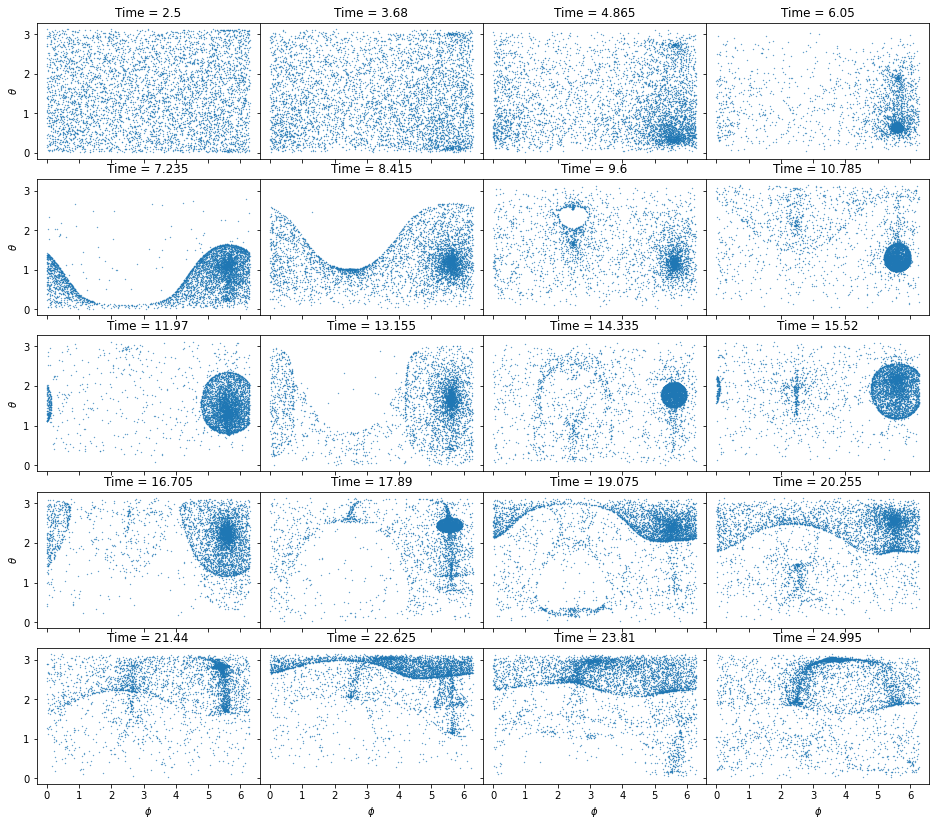

In [170]:
#5000/8 = 625
numPlots = 20
numRows,numCols = 5,4
fig = plt.figure(figsize=(16,14))
gs = fig.add_gridspec(numRows,numCols, hspace=0.15, wspace=0)
axs = gs.subplots(sharex='col',sharey='row')
StartTime = 500
TimesToPlot = np.linspace(StartTime,4999,num =numPlots,dtype = int)
for i in range(4):
    axs[0,i].scatter(phiVals[TimesToPlot[i],:],thetaVals[TimesToPlot[i],:],s=0.1)
    axs[0,i].set_title("Time = "+str(round(timeVals[TimesToPlot[i]],3)))
    axs[1,i].scatter(phiVals[TimesToPlot[i+4],:],thetaVals[TimesToPlot[i+4],:],s=0.1)
    axs[1,i].set_title("Time = "+str(round(timeVals[TimesToPlot[i+4]],3)))
    axs[2,i].scatter(phiVals[TimesToPlot[i+8],:],thetaVals[TimesToPlot[i+8],:],s=0.1)
    axs[2,i].set_title("Time = "+str(round(timeVals[TimesToPlot[i+8]],3)))
    axs[3,i].scatter(phiVals[TimesToPlot[i+12],:],thetaVals[TimesToPlot[i+12],:],s=0.1)
    axs[3,i].set_title("Time = "+str(round(timeVals[TimesToPlot[i+12]],3)))
    axs[4,i].scatter(phiVals[TimesToPlot[i+16],:],thetaVals[TimesToPlot[i+16],:],s=0.1)
    axs[4,i].set_title("Time = "+str(round(timeVals[TimesToPlot[i+16]],3)))
    axs[4,i].set_xlabel(r"$\phi$")
    axs[i,0].set_ylabel(r"$\theta$")

In [171]:
#3D plot
numPlots = 20
numRows,numCols = 5,4
fig = plt.figure(figsize=(16,14))
gs = fig.add_gridspec(numRows,numCols, hspace=0.15, wspace=0)
axs = gs.subplots(sharex='col',sharey='row')
StartTime = 500
TimesToPlot = np.linspace(StartTime,4999,num =numPlots,dtype = int)
for i in range(4):
    axs[0,i].set_title("Time = "+str(round(timeVals[TimesToPlot[i]],3)))
    axs[1,i].scatter(phiVals[TimesToPlot[i+4],:],thetaVals[TimesToPlot[i+4],:],s=0.1)
    axs[1,i].set_title("Time = "+str(round(timeVals[TimesToPlot[i+4]],3)))
    axs[2,i].scatter(phiVals[TimesToPlot[i+8],:],thetaVals[TimesToPlot[i+8],:],s=0.1)
    axs[2,i].set_title("Time = "+str(round(timeVals[TimesToPlot[i+8]],3)))
    axs[3,i].scatter(phiVals[TimesToPlot[i+12],:],thetaVals[TimesToPlot[i+12],:],s=0.1)
    axs[3,i].set_title("Time = "+str(round(timeVals[TimesToPlot[i+12]],3)))
    axs[4,i].scatter(phiVals[TimesToPlot[i+16],:],thetaVals[TimesToPlot[i+16],:],s=0.1)
    axs[4,i].set_title("Time = "+str(round(timeVals[TimesToPlot[i+16]],3)))
    axs[4,i].set_xlabel(r"$\phi$")
    axs[i,0].set_ylabel(r"$\theta$")

SyntaxError: invalid syntax (<ipython-input-171-c7d7468e977a>, line 10)

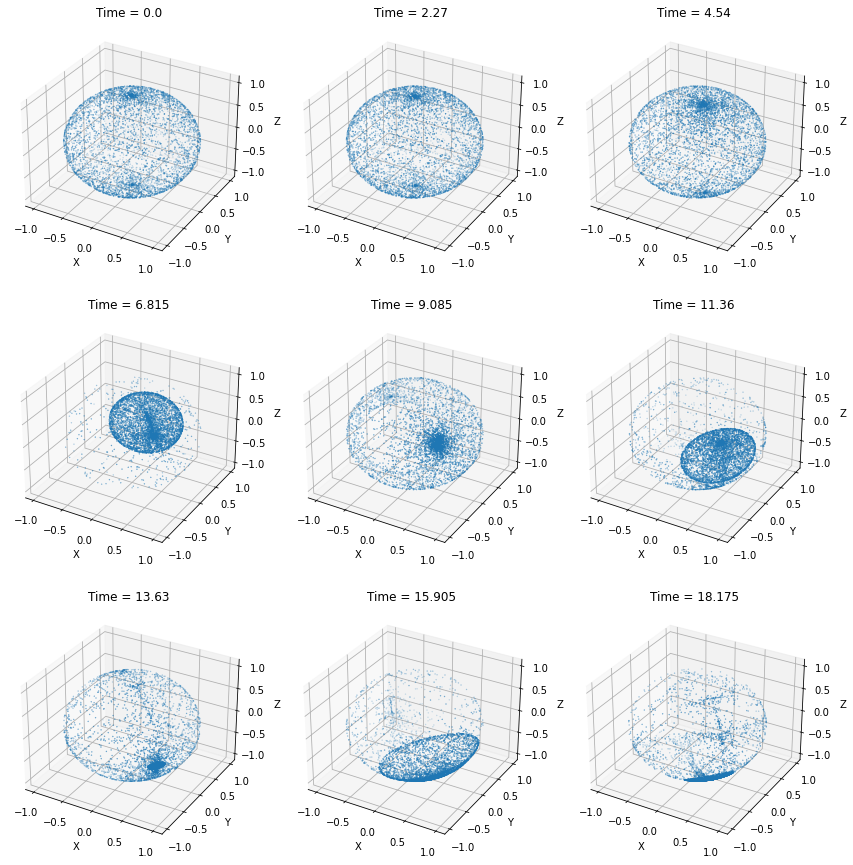

In [188]:
StartTime = 500
numPlots=12
TimesToPlot = np.linspace(0,4999,num =numPlots,dtype = int)

x,y,z = SphereToCart(phiVals,thetaVals)
def plot_particles(ax, x, y, z):
    ax.scatter(x, y, z, marker='o',s=0.1)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')

def main():
    fig, axes = plt.subplots(3, 3, subplot_kw={'projection': '3d'}, figsize=(12, 12))

    for i, ax in enumerate(axes.flat):
        plot_particles(ax, x[TimesToPlot[i]], y[TimesToPlot[i]], z[TimesToPlot[i]])
        ax.set_title('Time = '+str(round(timeVals[TimesToPlot[i]],3)))
    plt.tight_layout()
    plt.subplots_adjust(hspace=0.2)
    plt.show()

if __name__ == '__main__':
    main()

In [236]:

def G(x, a):
    return a * x**2 + x * (np.cosh(x) / np.sinh(x)) - 1

def G_derivative(x):
    return 2 * a * x + (np.cosh(x) / np.sinh(x)) - x * (np.cosh(x) / np.sinh(x)**2)

def newton_raphson(a, x0, epsilon=1e-6, max_iter=1000):
    x_curr = x0
    for i in range(max_iter):
        x_next = x_curr - G(x_curr, a) / G_derivative(x_curr)
        if abs(x_next - x_curr) < epsilon:
            return x_next
        x_curr = x_next
    raise Exception(f"Newton-Raphson method did not converge after {max_iter} iterations")

a = -0.2  # Choose the value of the parameter 'a'
x0 = 4  # Choose the initial guess for the root

try:
    root = newton_raphson(a, x0)
    print(f"Root: {root}")
except Exception as e:
    print(e)


Root: 3.6294102983197103


Text(0, 0.5, '$G(x)$')

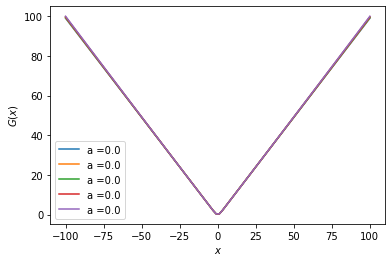

In [252]:
aVals = np.linspace(0,0.0001,num =5)
x = np.linspace(-100,100,num =100)
for i in range(5):
    a = aVals[i]
    y = G(x,a)
    plt.plot(x,y,label= "a ="+str(round(a,3)))
plt.legend()
plt.xlabel(r"$x$")
plt.ylabel(r"$G(x)$")